In [1]:
## Importing dependencies
import numpy as np
import pygmt
import pandas as pd
from glob import glob
import tqdm as tqdm
import obspy
from obspy.clients.fdsn import Client
import matplotlib.pyplot as plt


from scipy.interpolate import griddata as gd
import cartopy as cart
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.crs as ccrs
import cartopy.io.img_tiles as cigmt

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm



import seaborn as sns

In [2]:
## Opening the directory
files = glob('/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/*')
files

['/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/task2.docx',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/uuss_ysn.final.2021.pdf',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2a_Akash.docx',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/yellake.map',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/download',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2b_Akash.odt',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/YELLOWSTONEeq.catalog',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2b_Akash.docx',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Yellowstone_seismicity_map.png',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2a_Akash.odt',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/yell.border.g']

In [3]:
# importing the name
eq_cat_file = glob('/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/*.catalog')
eq_cat_file


['/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/YELLOWSTONEeq.catalog']

In [4]:
### Reading the catalog file. Note - it is not in proper format so we need to do some manipulations
yell_cat = pd.read_csv(eq_cat_file[0], header=None,names=['Date','Time(hh:mm)','Time(ss)','Lat_Deg','Lat_Min',
                                               'Lon_Deg', 'Long_Min', 'Depth', 'Mag', "Nos", 'AzG', 'Nearest',
                                              'RMS', 'EHR', 'EHZ','EHZ_s'],
            skipinitialspace=True,sep=' ',usecols=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])

/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


## Reading the values

In [5]:
Depth_all = yell_cat['Depth'].values  ### Note that after 2012 depths were computed with respect to sea level
### and before that depths were computed w.r.t to mean elevation of stations(~ 2 Km) So we need to subtract 2 Km for the pre 2012 event depths.
Nearest = yell_cat['Nearest'].values ### Distance to the nearest station. Depth of event is realistic if nearest == 1.4 focal depth
Mag = yell_cat['Mag'].values
RMS = yell_cat['RMS'].values  ## Error in Hypocentre 
EHZ = yell_cat['EHZ'].values    ## Vertical error in focal depths
EHZ_s = yell_cat['EHZ_s'].values 
Nos = yell_cat['Nos'].values   ## No. of stations
Date = yell_cat['Date'].values
Time = yell_cat['Time(hh:mm)'].values
Time_s = yell_cat['Time(ss)'].values
Azi = yell_cat['AzG'].values
dist_nearest = []
ehz = []
mag = []
for i in range(len(Depth_all)):    ### Fixing weird things in the catalog
        if Mag[i] == 'W':
            dist_nearest.append(RMS[i])
            ehz.append(EHZ_s[i])
            mag.append(Nos[i])
        else:
            dist_nearest.append(Nearest[i])
            ehz.append(EHZ[i])
            mag.append(Mag[i])

In [6]:
ev_lats_ddm = pd.read_csv(eq_cat_file[0], header=None, names=['Lat_Degree','Lat_Minute'],skipinitialspace=True,sep=' ',usecols=[3,4])
EV_lats =  ev_lats_ddm.values[:,0]+(ev_lats_ddm.values[:,1])/60
ev_lons_ddm = pd.read_csv(eq_cat_file[0],names=['Lon_Degree','Lon_Minute'],skipinitialspace=True,sep=' ',usecols=[5,6])
EV_lons =  (ev_lons_ddm.values[:,0]+(ev_lons_ddm.values[:,1])/60)*(-1)


## Selecting Good Depths

In [7]:
depths_good = []
ev_lons_good = []
ev_lats_good = []
mags_good = [] 
index = []
#ehz = np.array(ehz).astype('float')
for i in range(len(Depth_all)):
    if float(dist_nearest[i]) <= float(Depth_all[i]): 
        index.append(i)
        depths_good.append(Depth_all[i])
        ev_lons_good.append(EV_lons[i])
        ev_lats_good.append(EV_lats[i])
        mags_good.append(mag[i])
        
        
index = np.array(index)
depths_good = np.array(depths_good)
ev_lons_good = np.array(ev_lons_good)
ev_lats_good = np.array(ev_lats_good)
mags_good = np.array(mags_good)

In [8]:
## Find the index of 12 october 2012 where the change took place.  In the original depths its index was 39041
np.where(index == 39003)

(array([17040]),)

In [9]:
depths_good_before_2012 = depths_good[0:17041]-2  #17041 represents the index 
depths_good_after_2012 = depths_good[17041:26302]
depths_g = np.concatenate((depths_good_before_2012, depths_good_after_2012))

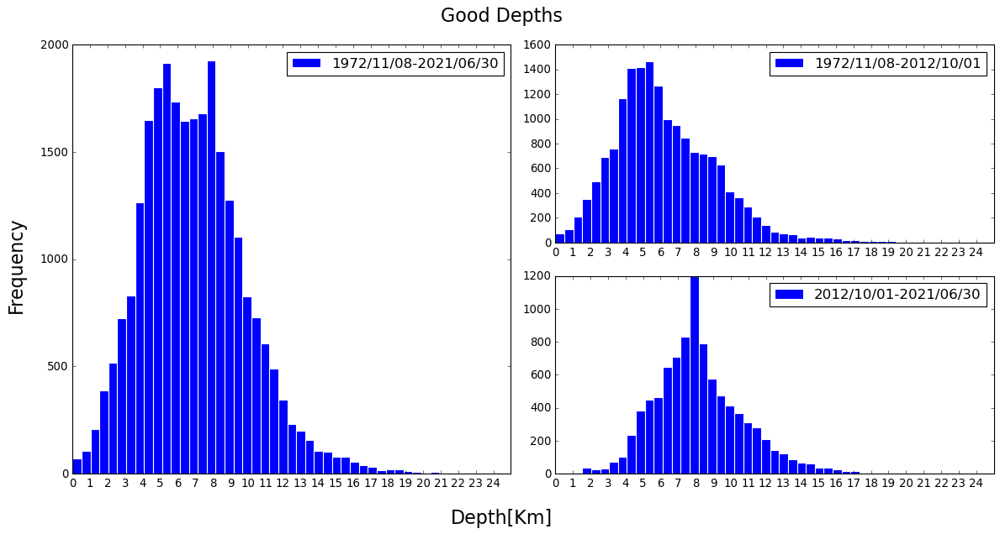

In [10]:
plt.style.use('classic')
import matplotlib.pyplot as plt
bins = np.linspace(0,25,50)

fig = plt.figure(figsize=[15,8],facecolor='white')


ax1 = plt.subplot2grid(shape=(2,2),loc=(0,0),rowspan=2)
ax1.hist(depths_g,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='1972/11/08-2021/06/30')
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)

ax1 = plt.subplot2grid(shape=(2,2),loc=(0,1),colspan=1)
ax1.hist(depths_good_before_2012,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='1972/11/08-2012/10/01')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)

ax1 = plt.subplot2grid(shape=(2,2),loc=(1,1),colspan=1)
ax1.hist(depths_good_after_2012,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='2012/10/01-2021/06/30')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)
fig.supylabel('Frequency',x=0.01,fontsize=20)
fig.supxlabel('Depth[Km]',y=0.01,fontsize=20)
fig.suptitle('Good Depths',y=0.98,fontsize=20)
fig.tight_layout()
plt.show()

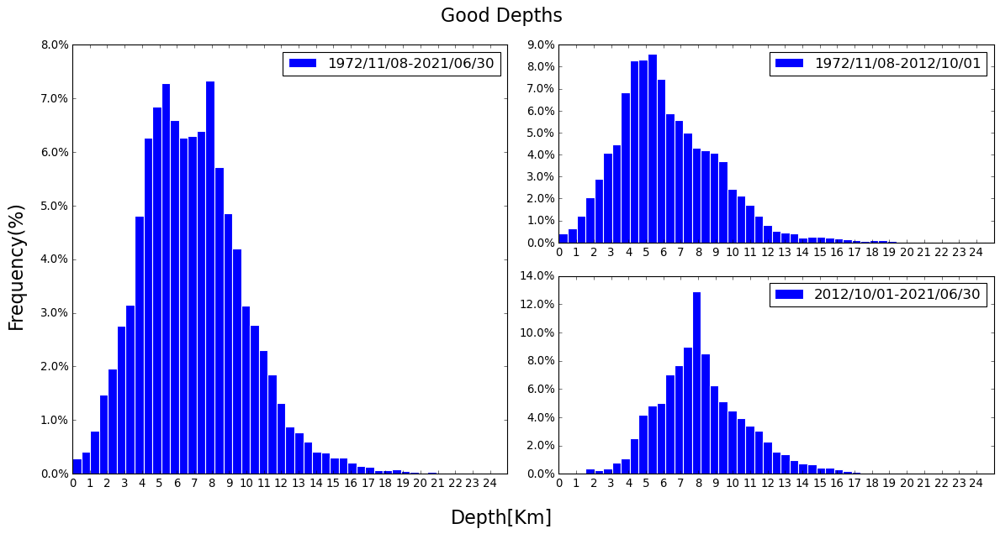

In [11]:
plt.style.use('classic')
import matplotlib.pyplot as plt
bins = np.linspace(0,25,50)

fig = plt.figure(figsize=[15,8],facecolor='white')
from matplotlib.ticker import PercentFormatter


ax1 = plt.subplot2grid(shape=(2,2),loc=(0,0),rowspan=2)
a = ax1.hist(depths_g,bins=bins, histtype='bar',weights=np.ones(len(depths_good)) / len(depths_good),
         stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='1972/11/08-2021/06/30')
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))


ax1 = plt.subplot2grid(shape=(2,2),loc=(0,1),colspan=1)
ax1.hist(depths_good_before_2012,bins=bins, histtype='bar',stacked=True,
         rwidth=1, weights=np.ones(len(depths_good_before_2012)) / len(depths_good_before_2012),
         cumulative=False,edgecolor='white',label='1972/11/08-2012/10/01')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))


ax1 = plt.subplot2grid(shape=(2,2),loc=(1,1),colspan=1)
ax1.hist(depths_good_after_2012,bins=bins, histtype='bar',
         stacked=True,rwidth=1,weights=np.ones(len(depths_good_after_2012)) / len(depths_good_after_2012),
         cumulative=False,edgecolor='white',label='2012/10/01-2021/06/30')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)
fig.supylabel('Frequency(%)',x=0.01,fontsize=20)
fig.supxlabel('Depth[Km]',y=0.01,fontsize=20)
fig.suptitle('Good Depths',y=0.98,fontsize=20)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
fig.tight_layout()
plt.show()

Depth above which 90% of the earthquakes occur: 10.7299714599Km
Depth above which 90% of the earthquakes occur: 12.0599741199Km


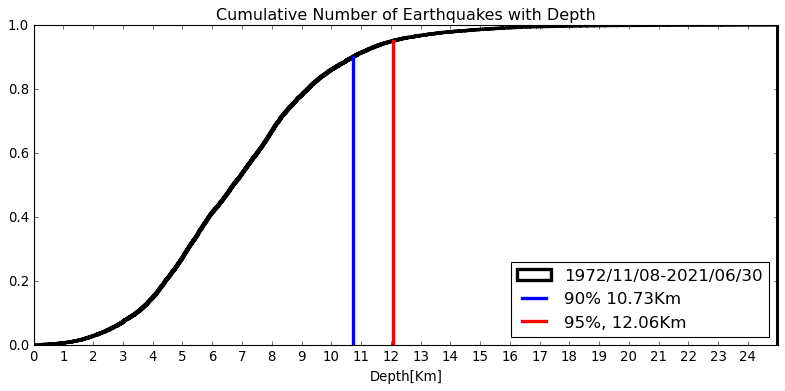

In [12]:
plt.style.use('classic')
import matplotlib.pyplot as plt
bins = np.linspace(0,25,500000)

fig = plt.figure(figsize=[12,5],facecolor='white')


ax1 = plt.subplot2grid(shape=(1,1),loc=(0,0),rowspan=1)
a = ax1.hist(depths_g,bins=bins, histtype='step',stacked=True,rwidth=1,color='black',density=True,
         cumulative=True,edgecolor='black',label='1972/11/08-2021/06/30',linewidth = 3)
ax1.set_xticks(np.arange(0,25,1))


print('Depth above which 90% of the earthquakes occur: '+ str(a[1][0:-1][a[0] >= 0.9][0])+'Km')
print('Depth above which 90% of the earthquakes occur: '+ str(a[1][0:-1][a[0] >= 0.95][0])+'Km')

#ax1.axhline(0.9,xmax = 10.80,lw = 3,label = '90%')
ax1.axvline(10.73,ymax=0.9,lw = 3,label = '90% 10.73Km')
#ax1.axhline(0.95,xmax=12.16,lw = 3,label = '95%',color='red')
ax1.axvline(12.06,ymax=0.95,lw = 3,color='red',label = '95%, 12.06Km')
ax1.legend(fontsize=15,loc='lower right')
ax1.set_title('Cumulative Number of Earthquakes with Depth')
plt.xlabel('Depth[Km]')
plt.show()

## Computing the 95% Depth in each cell

#### Steps
1) Divide the entire area into 25x25 cells <br>
2) Compute the earthquakes in each cell, store their depths <br>
3) Compute 95%% depth in each cell

We can also lookout for anamalously deep earthquakes with depth >10 Km+95% depths in their corresponding cells. The variable 'g' stores the information of such events in the below code. 

In [13]:
n = 25
lon_grid = np.linspace(-111.5, -109.7, n)
lat_grid = np.linspace(44, 45.1, n)

depths = depths_g
ev_lons = ev_lons_good
ev_lats = ev_lats_good
max_depths = np.empty([len(lon_grid),len(lat_grid)])  # random values
max_depths[:] = np.nan
g = []

from tqdm import tqdm
for i in tqdm(range(len(lon_grid)-1)):
    for j in range(len(lat_grid)-1):
        z = []
        g_lats = []
        g_lons = []
        
        for k in range(len(ev_lons)):
                if ev_lons[k] >= lon_grid[i] and ev_lons[k] <= lon_grid[i+1]:
                    if ev_lats[k] >= lat_grid[j] and ev_lats[k] <= lat_grid[j+1]:
                        z.append(depths[k])
                        g_lats.append(ev_lats[k])
                        g_lons.append(ev_lons[k])
        
        if len(z) >= 2:
            a = ax1.hist(z,bins=bins, histtype='step',stacked=True,density=True,
            cumulative=True)
            max_depths[i,j] = a[1][0:-1][a[0] >= 0.95][0]
            for d in range(len(z)):
                if z[d]-max_depths[i,j] >= 10:
                    g.append([g_lons[d],g_lats[d], z[d], z[d]-max_depths[i,j]])
                    
g=np.array(g)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:19<00:00,  1.23it/s]


### For xyz2grd implementation in python we need to convert our data into xarray format firtst

# Plotting 95% depths

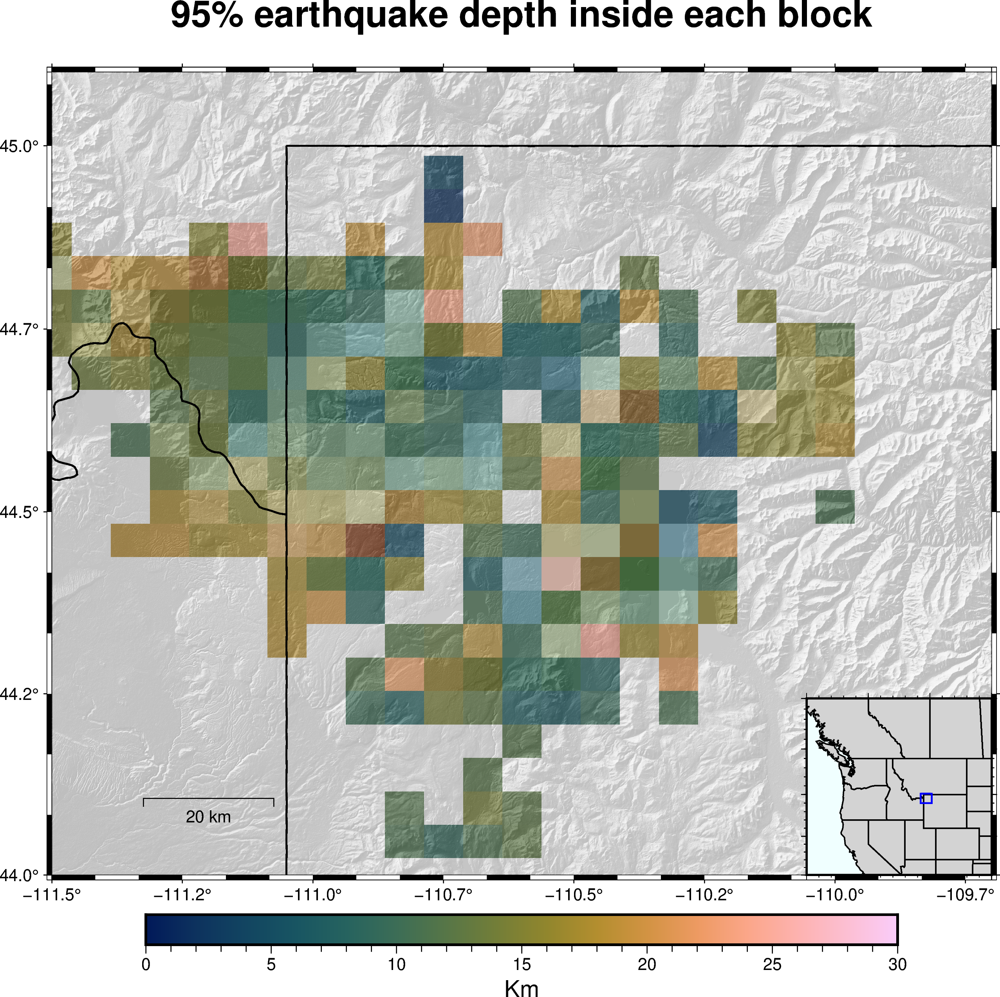

In [15]:
import xarray as xr
da = xr.DataArray(data= max_depths.transpose(), coords = dict(lon=lat_grid, lat=lon_grid), name='z')

region=[-111.5,-109.7, 44, 45.1]
fig = pygmt.Figure()
pygmt.config(FORMAT_GEO_MAP="ddd.x")



pygmt.makecpt(cmap='batlow',series='0/30/2',continuous=True)
fig.grdimage(grid=da,region=region,projection='M8i',shading=True,cmap=True,
            frame=["af",'+t"95% earthquake depth inside each block"'])

fig.colorbar(frame=['"x+lKm"'])
# plot slightly transparent landmasses on top


pygmt.makecpt(cmap='gray',series='-1000/6000/100',continuous=True)
topo_data = '@earth_relief_01s'
fig.grdimage(grid=topo_data,region=region,projection='M8i',cmap=True,shading=True,transparency=60)


#fig.plot(x=ev_lons,y=ev_lats, style='c0.1c',pen='1p,black',region=region,
#        color="white", transparency=80)

fig.coast(region=region,borders="2/thick", map_scale='"g-111.2/44.1+w20"')

with fig.inset(position="jBR+w4c+o-0.0c/-0.0c", box=False,no_clip=True):
    # Plot the Japan main land in the inset using coast. "U54S/?" means UTM
    # projection with map width automatically determined from the inset width.
    # Highlight the Japan area in "lightbrown"
    # and draw its outline with a pen of "0.2p".
    topo_data = '@earth_relief_01m'
    region1 = [-130,-100,35,55]
    proj = "M4c"
    #fig.grdimage(region=region1,projection='"M4c"',shading=True,            
    #             frame=["WsNe", "xaf", "yaf"])
    
    pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain")
    rectangle = [[region[0], region[2], region[1], region[3]]]
    #fig.plot(data=rectangle, style="r+s", pen="2p,blue",projection=proj)
    fig.coast(area_thresh = 10000,
        region=region1,
        projection=proj,
        borders=["2/thin","1/thin"],
        shorelines="thin",
        water="azure1",
        land= 'lightgray',
        frame=["wsne", "xaf", "yaf"],
        resolution = 'l')
    fig.plot(data=rectangle, style="r+s", pen="1p,blue",projection=proj)



fig.show()

# Computing the Histogram of Earthquakes

In [16]:
a = np.histogram2d(ev_lons_good, ev_lats_good, bins=25, range=[[-111.5,-109.7], [44, 45.1]])

for i in range(np.shape(a[0])[0]):
    for j in range(np.shape(a[0])[1]):
        if a[0][i,j] == 0:
            a[0][i,j] = np.nan

In [17]:
import xarray as xr
da = xr.DataArray(data= a[0].transpose(), coords = dict(lon=lat_grid, lat=lon_grid), name='z')

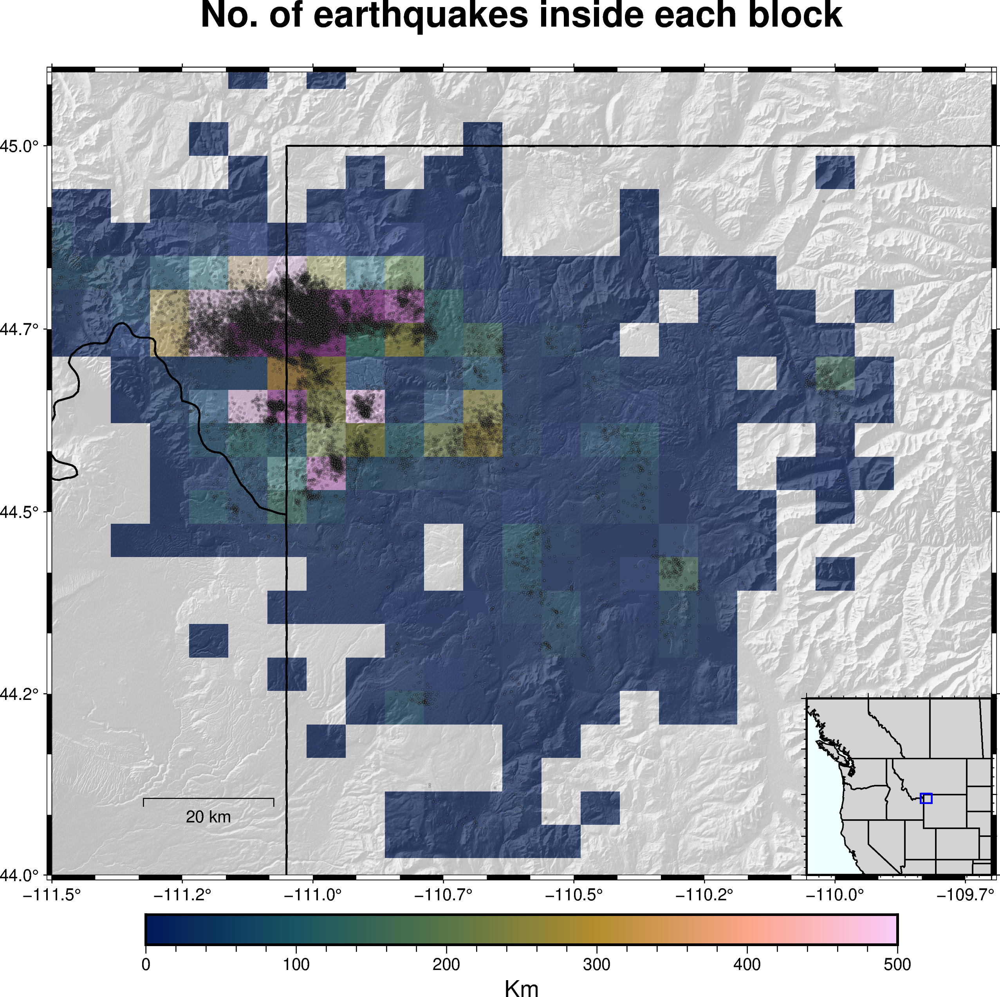

In [18]:
region=[-111.5,-109.7, 44, 45.1]
fig = pygmt.Figure()
pygmt.config(FORMAT_GEO_MAP="ddd.x")



pygmt.makecpt(cmap='batlow',series='0/500/100',continuous=True)
fig.grdimage(grid=da,region=region,projection='M8i',shading=True,cmap=True,
            frame=["af",'+t"No. of earthquakes inside each block"'])

fig.colorbar(frame=['"x+lKm"'])
# plot slightly transparent landmasses on top


pygmt.makecpt(cmap='gray',series='-1000/6000/100',continuous=True)
topo_data = '@earth_relief_01s'
fig.grdimage(grid=topo_data,region=region,projection='M8i',cmap=True,shading=True,transparency=60)


fig.plot(x=ev_lons,y=ev_lats, style='c0.02c',pen='1p,black',region=region,
        color="white", transparency=80)

fig.coast(region=region,borders="2/thick", map_scale='"g-111.2/44.1+w20"')

with fig.inset(position="jBR+w4c+o-0.0c/-0.0c", box=False,no_clip=True):
    # Plot the Japan main land in the inset using coast. "U54S/?" means UTM
    # projection with map width automatically determined from the inset width.
    # Highlight the Japan area in "lightbrown"
    # and draw its outline with a pen of "0.2p".
    topo_data = '@earth_relief_01m'
    region1 = [-130,-100,35,55]
    proj = "M4c"
    #fig.grdimage(region=region1,projection='"M4c"',shading=True,            
    #             frame=["WsNe", "xaf", "yaf"])
    
    pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain")
    rectangle = [[region[0], region[2], region[1], region[3]]]
    #fig.plot(data=rectangle, style="r+s", pen="2p,blue",projection=proj)
    fig.coast(area_thresh = 10000,
        region=region1,
        projection=proj,
        borders=["2/thin","1/thin"],
        shorelines="thin",
        water="azure1",
        land= 'lightgray',
        frame=["wsne", "xaf", "yaf"],
        resolution = 'l')
    fig.plot(data=rectangle, style="r+s", pen="1p,blue",projection=proj)



fig.show()

/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


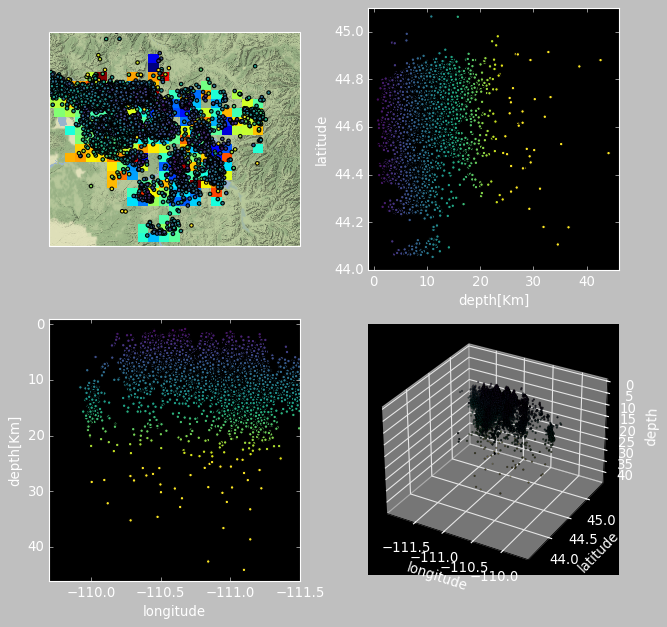

In [19]:
l = len(ev_lats)
#%matplotlib notebook
x = ev_lats
y = ev_lons
z = depths_good
depth = depths_good
nfr = len(ev_lats)
fps = 20

#mag = np.array(mag).astype('float').reshape(1,l)
x = x.reshape(1,l)[0]
y = y.reshape(1,l)[0]
z = z.reshape(1,l)[0]

fig = plt.figure(figsize = [8,8] )
plt.style.use('dark_background')
ax2 = fig.add_subplot(2, 2, 2)
ax1.set_aspect('auto')
ax1 = fig.add_subplot(2, 2, 1,projection=ccrs.Mercator())
ax1.coastlines()
ax1.set_extent([-111.5,-109.7, 44, 45.1])
stamen_terrain = cigmt.Stamen('terrain-background')
ax1.add_image(stamen_terrain,10)
ax1.pcolormesh(lon_grid, lat_grid,max_depths.transpose(), transform=ccrs.PlateCarree())
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4,projection='3d')



ax4.set_xlabel('longitude')
ax4.set_ylabel('latitude')
ax4.set_zlabel('depth')
ax4.set_xlim(min(y)-0.3,max(y)+0.3)
ax4.set_ylim(min(x)-0.3, max(x)+0.3)
ax4.set_zlim(max(depth),0)

ax1.set_xlabel('longitude',transform=ccrs.PlateCarree())
ax1.set_ylabel('latitude',transform=ccrs.PlateCarree())
#ax2.set_xlim(min(y),max(y),transform=ccrs.PlateCarree())
#ax2.set_ylim(min(x),max(x),transform=ccrs.PlateCarree())

ax2.set_xlabel('depth[Km]')
ax2.set_ylabel('latitude')
ax2.set_ylim(44,45.1)
ax2.set_xlim(-1,max(depth)+2)

ax3.set_xlabel('longitude')
ax3.set_ylabel('depth[Km]')
ax3.set_xlim(-109.7,-111.5)
ax3.set_ylim(max(depth)+2, -1)

ax1.ticklabel_format(useOffset=False)
ax2.ticklabel_format(useOffset=False)
ax3.ticklabel_format(useOffset=False)
ax4.ticklabel_format(useOffset=False)



ax4.scatter3D(y,x,z,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25, edgecolor='k',s=1)
ax1.scatter(y,x,transform=ccrs.PlateCarree(),marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='k', s=10)
ax3_plot = ax2.scatter(depth,x,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='k',s=10)
ax4_plot = ax3.scatter(y,depth,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='k',s=10)

    
    

#ani = animation.FuncAnimation(fig, update, nfr, interval=1, fps = 2000,repeat=False)
#fig.colorbar(ax3_plot, ax=ax2,orientation='vertical',label='Depth[Km]')
#fig.colorbar(ax4_plot, ax=ax3,orientation='horizontal',label='Depth[Km]')
plt.tight_layout()

#FFwriter = animation.FFMpegWriter(fps = 100)
#ani.save('canary_islands.mp4', writer = FFwriter)

# Plotting anamalously deep events

/tmp/ipykernel_21046/128888061.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be rem

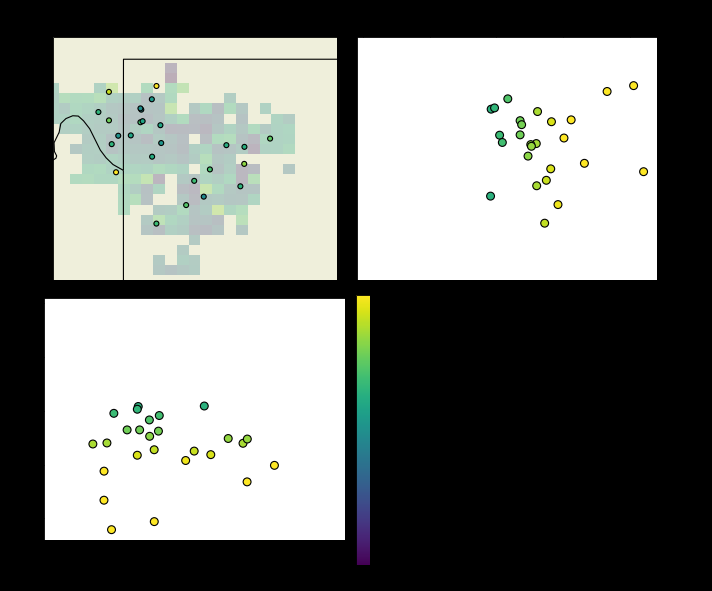

In [20]:
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

l = len(g)
#%matplotlib notebook
x = g[:,1]
y = g[:,0]
z = g[:,2]
depth = g[:,2]
nfr = len(ev_lats)
fps = 20

#mag = np.array(mag).astype('float').reshape(1,l)
x = x.reshape(1,l)[0]
y = y.reshape(1,l)[0]
z = z.reshape(1,l)[0]

fig = plt.figure(figsize = [9,7.5] )
plt.style.use('default')
ax1.set_aspect('auto')
ax1 = fig.add_subplot(2, 2, 1,projection=ccrs.Mercator())
ax2 = fig.add_subplot(2, 2, 2)
ax1.coastlines()
ax1.set_extent([-111.5,-109.7, 44, 45.1])
#stamen_terrain = cigmt.Stamen('terrain-background')
#ax1.add_image(stamen_terrain,10)
ax1.pcolormesh(lon_grid, lat_grid,max_depths.transpose(), transform=ccrs.PlateCarree(), alpha=0.3, cmap='viridis',vmin=0,vmax=30)
ax3 = fig.add_subplot(2, 2, 3)
#ax4 = fig.add_subplot(2, 2, 4)



#ax4.set_xlabel('longitude')
#ax4.set_ylabel('latitude')
#ax4.set_zlabel('depth')
#ax4.set_xlim(min(y)-0.3,max(y)+0.3)
#ax4.set_ylim(min(x)-0.3, max(x)+0.3)
#ax4.set_zlim(max(depth),0)

ax1.set_xlabel('longitude',transform=ccrs.PlateCarree())
ax1.set_ylabel('latitude',transform=ccrs.PlateCarree())
#ax2.set_xlim(min(y),max(y),transform=ccrs.PlateCarree())
#ax2.set_ylim(min(x),max(x),transform=ccrs.PlateCarree())

ax2.set_xlabel('depth[Km]')
ax2.set_ylabel('latitude')
ax2.set_ylim(44,45.1)
ax2.set_xlim(-1,max(depth)+2)

ax3.set_xlabel('longitude')
ax3.set_ylabel('depth[Km]')
ax3.set_xlim(-111.5,-109.7)
ax3.set_ylim(max(depth)+2, -1)

ax1.ticklabel_format(useOffset=False)
ax2.ticklabel_format(useOffset=False)
ax3.ticklabel_format(useOffset=False)
ax4.ticklabel_format(useOffset=False)

ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
ax2.xaxis.tick_top()
ax2.xaxis.set_label_position("top")


#ax4.scatter3D(y,x,z,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25, edgecolor='k',s=50)
ax1.scatter(y,x,transform=ccrs.PlateCarree(),marker='o',c=depth,cmap='viridis',vmin=0,vmax=40,edgecolor='k', s=20)
ax3_plot = ax2.scatter(depth,x,marker='o',c=depth,cmap='viridis',vmin=0,vmax=30,edgecolor='k',s=50)
ax4_plot = ax3.scatter(y,depth,marker='o',c=depth,cmap='viridis',vmin=0,vmax=30,edgecolor='k',s=50)

ax1.add_feature(cfeature.LAND)
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(states_provinces, edgecolor='black') 
plt.xticks(rotation=15)
    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.50, 0.05, 0.02, 0.45])

#ani = animation.FuncAnimation(fig, update, nfr, interval=1, fps = 2000,repeat=False)
#fig.colorbar(ax3_plot, ax=ax2,orientation='vertical',label='Depth[Km]', use_gridspec=True, shrink=1, fraction=0.5)
fig.colorbar(ax4_plot, ax=ax3,cax=cbar_ax, orientation='vertical',label='Depth[Km]', use_gridspec=True, shrink=0.1)
plt.tight_layout()

#FFwriter = animation.FFMpegWriter(fps = 100)
#ani.save('canary_islands.mp4', writer = FFwriter)

/tmp/ipykernel_21046/2049894543.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be re

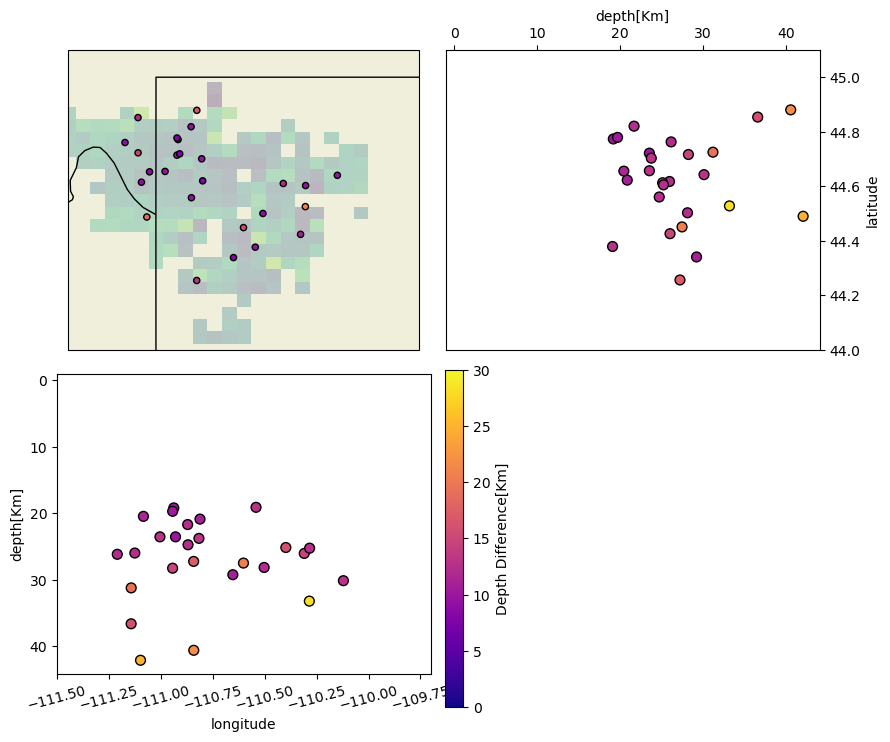

In [21]:
l = len(g)
#%matplotlib notebook
x = g[:,1]
y = g[:,0]
z = g[:,2]
depth = g[:,2]
depth_diff = g[:,3]
nfr = len(ev_lats)
fps = 20

#mag = np.array(mag).astype('float').reshape(1,l)
x = x.reshape(1,l)[0]
y = y.reshape(1,l)[0]
z = z.reshape(1,l)[0]

fig = plt.figure(figsize = [9,7.5] )
plt.style.use('default')
ax1.set_aspect('auto')
ax1 = fig.add_subplot(2, 2, 1,projection=ccrs.Mercator())
ax2 = fig.add_subplot(2, 2, 2)
ax1.coastlines()
ax1.set_extent([-111.5,-109.7, 44, 45.1])
#stamen_terrain = cigmt.Stamen('terrain-background')
#ax1.add_image(stamen_terrain,10)
ax1.pcolormesh(lon_grid, lat_grid,max_depths.transpose(), transform=ccrs.PlateCarree(), alpha=0.3, cmap='viridis',vmin=0,vmax=30)
ax3 = fig.add_subplot(2, 2, 3)
#ax4 = fig.add_subplot(2, 2, 4)



#ax4.set_xlabel('longitude')
#ax4.set_ylabel('latitude')
#ax4.set_zlabel('depth')
#ax4.set_xlim(min(y)-0.3,max(y)+0.3)
#ax4.set_ylim(min(x)-0.3, max(x)+0.3)
#ax4.set_zlim(max(depth),0)

ax1.set_xlabel('longitude',transform=ccrs.PlateCarree())
ax1.set_ylabel('latitude',transform=ccrs.PlateCarree())
#ax2.set_xlim(min(y),max(y),transform=ccrs.PlateCarree())
#ax2.set_ylim(min(x),max(x),transform=ccrs.PlateCarree())

ax2.set_xlabel('depth[Km]')
ax2.set_ylabel('latitude')
ax2.set_ylim(44,45.1)
ax2.set_xlim(-1,max(depth)+2)

ax3.set_xlabel('longitude')
ax3.set_ylabel('depth[Km]')
ax3.set_xlim(-111.5,-109.7)
ax3.set_ylim(max(depth)+2, -1)

ax1.ticklabel_format(useOffset=False)
ax2.ticklabel_format(useOffset=False)
ax3.ticklabel_format(useOffset=False)
ax4.ticklabel_format(useOffset=False)

ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")
ax2.xaxis.tick_top()
ax2.xaxis.set_label_position("top")


#ax4.scatter3D(y,x,z,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25, edgecolor='k',s=50)
ax1.scatter(y,x,transform=ccrs.PlateCarree(),marker='o',c=depth_diff,cmap='plasma',vmin=0,vmax=40,edgecolor='k', s=20)
ax3_plot = ax2.scatter(depth,x,marker='o',c=depth_diff,cmap='plasma',vmin=0,vmax=30,edgecolor='k',s=50)
ax4_plot = ax3.scatter(y,depth,marker='o',c=depth_diff,cmap='plasma',vmin=0,vmax=30,edgecolor='k',s=50)

ax1.add_feature(cfeature.LAND)
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(states_provinces, edgecolor='black') 
plt.xticks(rotation=15)
    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.50, 0.05, 0.02, 0.45])

#ani = animation.FuncAnimation(fig, update, nfr, interval=1, fps = 2000,repeat=False)
#fig.colorbar(ax3_plot, ax=ax2,orientation='vertical',label='Depth[Km]', use_gridspec=True, shrink=1, fraction=0.5)
fig.colorbar(ax4_plot, ax=ax3,cax=cbar_ax, orientation='vertical',label='Depth Difference[Km]', use_gridspec=True, shrink=0.1)
plt.tight_layout()

#FFwriter = animation.FFMpegWriter(fps = 100)
#ani.save('canary_islands.mp4', writer = FFwriter)

In [22]:
lat_grid

array([ 44.        ,  44.04583333,  44.09166667,  44.1375    ,
        44.18333333,  44.22916667,  44.275     ,  44.32083333,
        44.36666667,  44.4125    ,  44.45833333,  44.50416667,
        44.55      ,  44.59583333,  44.64166667,  44.6875    ,
        44.73333333,  44.77916667,  44.825     ,  44.87083333,
        44.91666667,  44.9625    ,  45.00833333,  45.05416667,  45.1       ])

In [23]:
lon_grid

array([-111.5  , -111.425, -111.35 , -111.275, -111.2  , -111.125,
       -111.05 , -110.975, -110.9  , -110.825, -110.75 , -110.675,
       -110.6  , -110.525, -110.45 , -110.375, -110.3  , -110.225,
       -110.15 , -110.075, -110.   , -109.925, -109.85 , -109.775, -109.7  ])

In [24]:
max_depths

array([[         nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
         14.72997946,  14.53997908,  14.28997858,  15.56998114,
                 nan,          nan,          nan,          nan,
                 nan],
       [         nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
                 nan,          nan,          nan,  13.66997734,
         15.20998042,  12.75997552,  19.85998972,          nan,
                 nan,          nan,          nan,          nan,
                 nan],
       [         nan,          nan,          nan,          nan,
                 nan,          nan,          nan,          nan,
                 nan,          nan,  18.48998698,         

In [25]:
Depth_all1  = np.concatenate((Depth_all[0:39003]-2,Depth_all[39003:54336]))
len(EV_lats)

54336

In [26]:
total = []
for i in range(len(EV_lats)):
    total.append([EV_lons[i], EV_lats[i], Depth_all1[i]])
    
total = np.array(total)

In [27]:
g1 = g[:,0:3]
g1 = np.array(g1)

inn = []
for i in range(len(g1)):
    for k in range(len(total)):
        if np.all(g1[i] == total[k]):
            inn.append(k)

In [52]:
time_hm

array([ 516, 1301, 1928, 1256, 1137, 1444, 1932, 1434, 1050, 2353, 1239,
       1748, 1547, 1215,   43, 1015,  247,  951, 1700,  124, 1954,   54,
        156, 1927, 2045, 1944])

In [28]:
Time_s[inn]

array([ 23.91,  56.87,  16.97,  40.39,  54.25,  51.82,   2.08,  20.5 ,
        12.9 ,  30.56,  31.21,  50.15,  32.72,  37.68,  53.45,   9.09,
        21.03,  29.22,  26.  ,  41.47,  14.2 ,  20.67,  17.52,   1.54,
        23.24,   6.53])

In [50]:
time_s = Time_s[inn]
time_hm = Time[inn]
date = Date[inn]


In [63]:
time_sec = []

for i in range(len(time_s)):
    time_sec.append(int(time_s[i]))

In [60]:
int(time_s[0])

23

In [51]:
len(str(time_s[0]))

5

In [107]:
time_new = []
for i in range(len(time_hm)): 
    if len(str(time_hm[i])) == 1:
        t= str(0)+str(0)+str(0)+str(time_hm[i])
        time_new.append(t)
        
    elif len(str(time_hm[i])) == 2:
        t = str(0)+str(0)+str(time_hm[i])
        time_new.append(t)
        
    elif len(str(time_hm[i])) == 3:
        t = str(str(0)+str(time_hm[i]))
        time_new.append(t)
    else:
        t = str(time_hm[i])
        time_new.append(t)
        
        
        
for i in range(len(time_sec)):
    if len(str(time_sec[i])) == 1:
        time_sec[i] = str(0)+str(time_sec[i])




for i in range(len(date)):
    if len(str(date[i])) == 3:
        date[i] = int(str(20000)+str(date[i]))

    if len(str(date[i])) == 5:
        date[i] = int(str(200)+str(date[i]))
        
    if len(str(date[i])) == 6:
        if int(str(date[i])[0:2]) > 70:
            date[i] = int(str(19)+str(date[i]))
        else:
            date[i] = int(str(20)+str(date[i]))

In [109]:
ts = []

for i in range(len(date)):
    ts.append(pd.to_datetime(str(date[i])+time_new[i]+str(time_sec[i])))

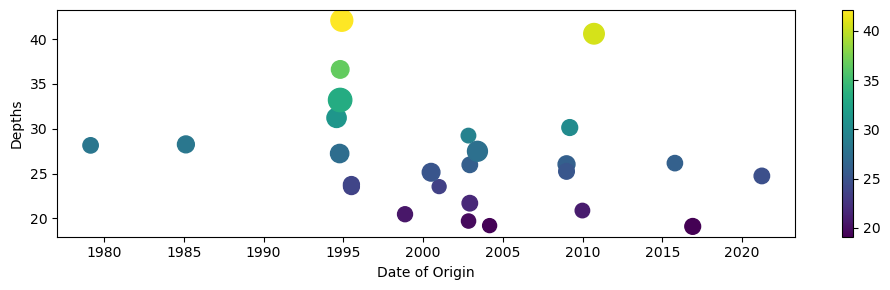

In [111]:
plt.figure(figsize=[10,3])
plt.scatter(ts, g1[:,2], c=g1[:,2], s=g[:,3]*10)
plt.colorbar()
plt.ylabel('Depths')
plt.xlabel('Date of Origin')
plt.tight_layout()

In [117]:
df = pd.DataFrame({'Longitude':g1[:,0],'Latitude':g1[:,1],'Depth':g1[:,2],'Time':ts})
df.to_csv('/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Anomalouslt_deep_events.csv')

In [38]:
obspy.UTCDateTime(date[0])

1970-08-22T05:30:14.000000Z

In [39]:
date[0]

20151014

In [41]:
obspy.UTCDateTime(ts[0])

2015-10-14T00:00:00.000000Z

In [47]:
pd.to_datetime(str(date[0])+'0'+str(Time[0]))

Timestamp('2015-10-14 09:54:00')

In [45]:
Time[0]

954

In [69]:
time_hm

array([ 516, 1301, 1928, 1256, 1137, 1444, 1932, 1434, 1050, 2353, 1239,
       1748, 1547, 1215,   43, 1015,  247,  951, 1700,  124, 1954,   54,
        156, 1927, 2045, 1944])

In [70]:
time_sec

[23,
 56,
 16,
 40,
 54,
 51,
 '02',
 20,
 12,
 30,
 31,
 50,
 32,
 37,
 53,
 '09',
 21,
 29,
 26,
 41,
 14,
 20,
 17,
 '01',
 23,
 '06']

In [74]:
len(str(time_hm[0]))

3

In [75]:
i = 0
time_hm[i] = str(0)+str(time_hm[i])

In [78]:
time_hm

array([ 516, 1301, 1928, 1256, 1137, 1444, 1932, 1434, 1050, 2353, 1239,
       1748, 1547, 1215,   43, 1015,  247,  951, 1700,  124, 1954,   54,
        156, 1927, 2045, 1944])

In [80]:
str(0)+str(time_hm[0])

'0516'

In [85]:
len(time_new)

1

In [84]:
len(time_hm)

26

In [92]:
type(time_new[0])

numpy.float64

In [110]:
time_new

['0516',
 '1301',
 '1928',
 '1256',
 '1137',
 '1444',
 '1932',
 '1434',
 '1050',
 '2353',
 '1239',
 '1748',
 '1547',
 '1215',
 '0043',
 '1015',
 '0247',
 '0951',
 '1700',
 '0124',
 '1954',
 '0054',
 '0156',
 '1927',
 '2045',
 '1944']

In [95]:
t = str(str(0)+str(time_hm[0]))

In [96]:
t

'0516'